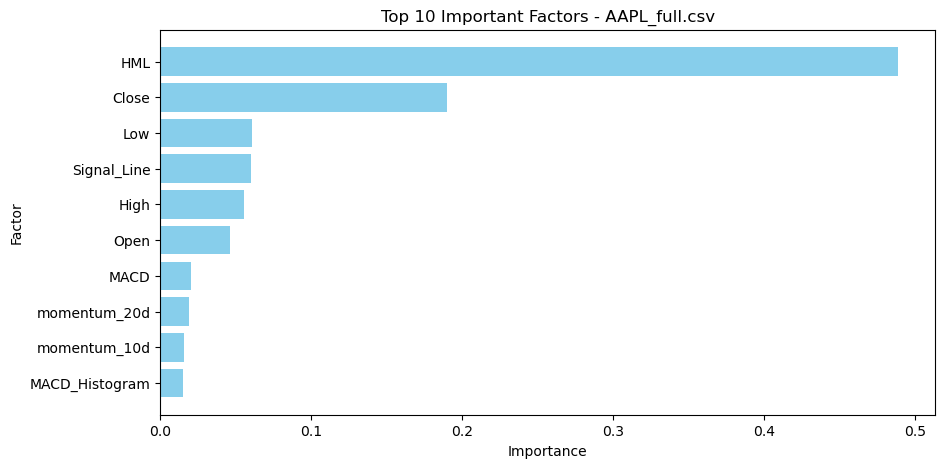

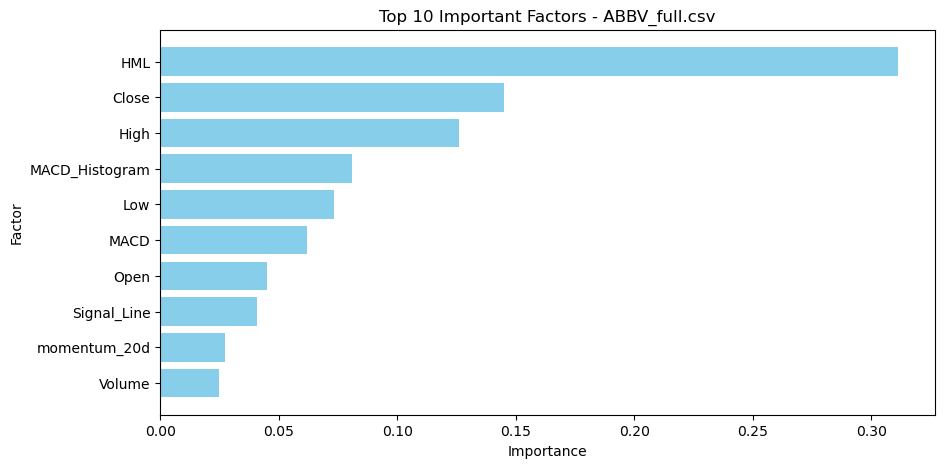

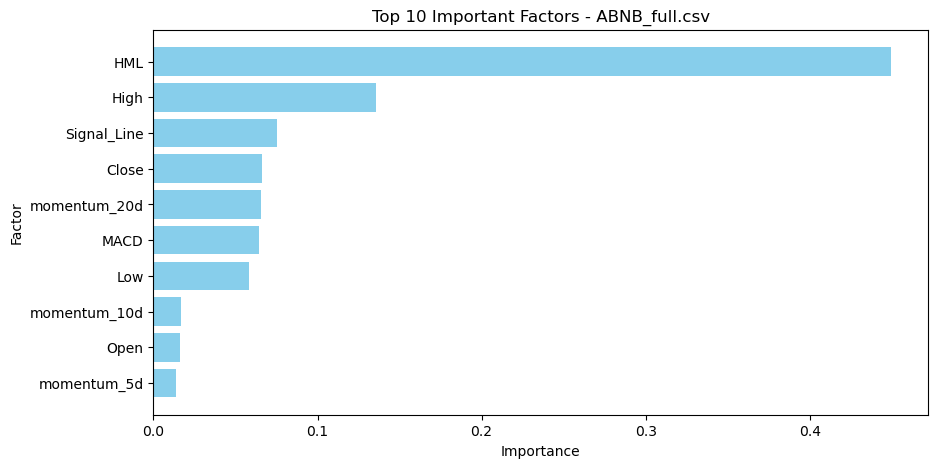

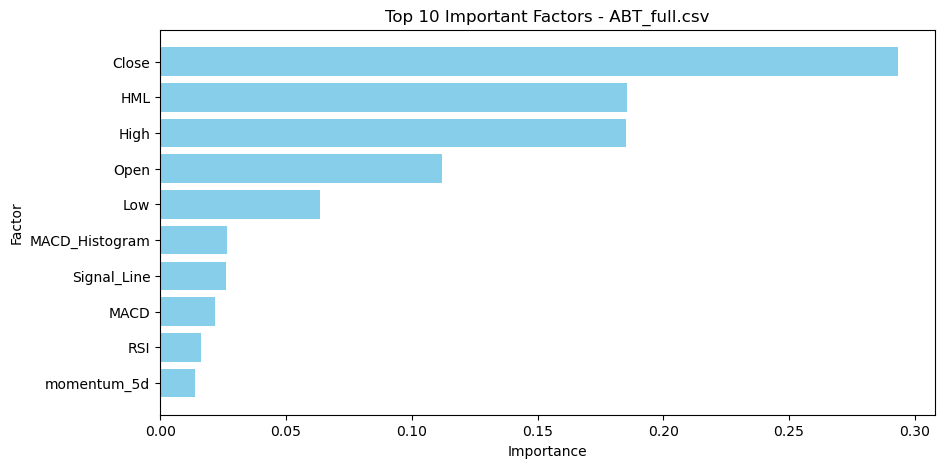

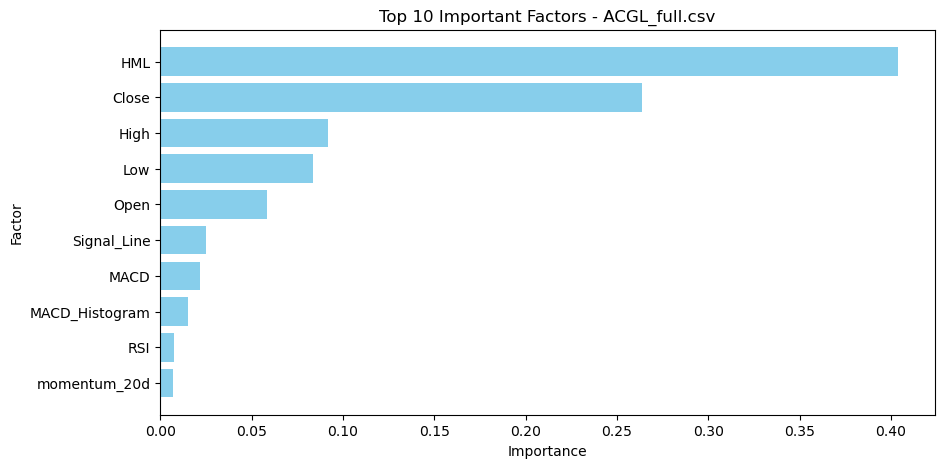

...

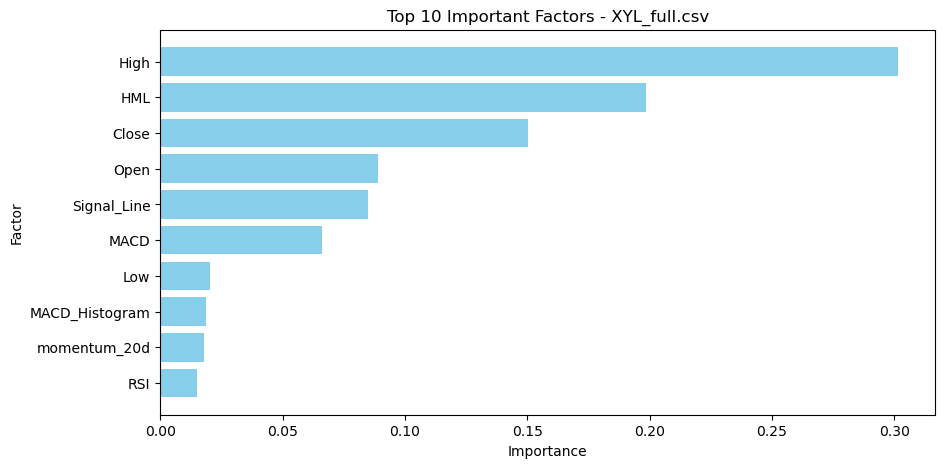

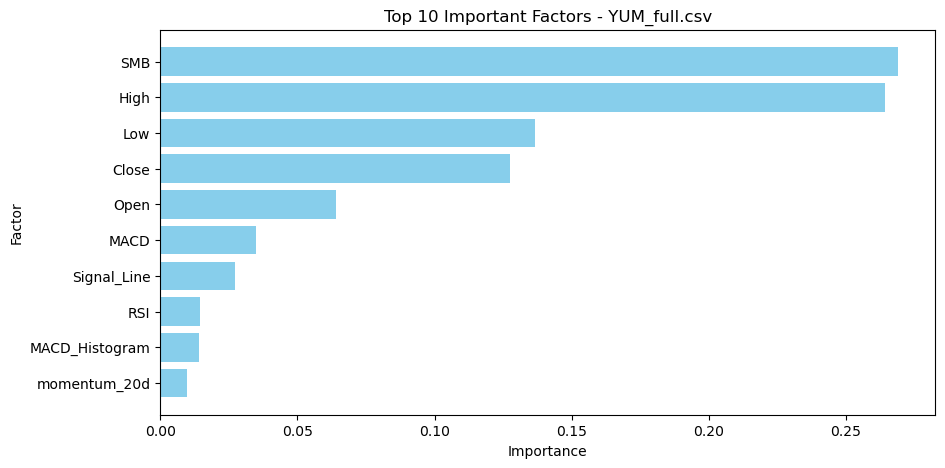

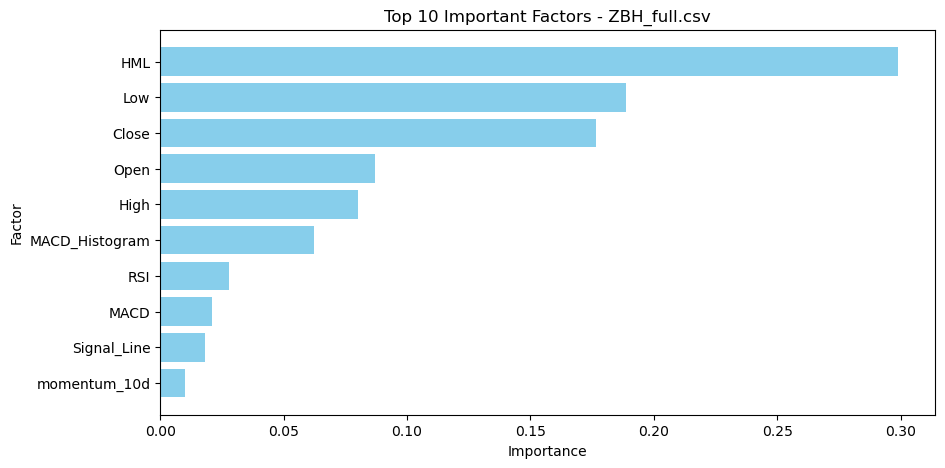

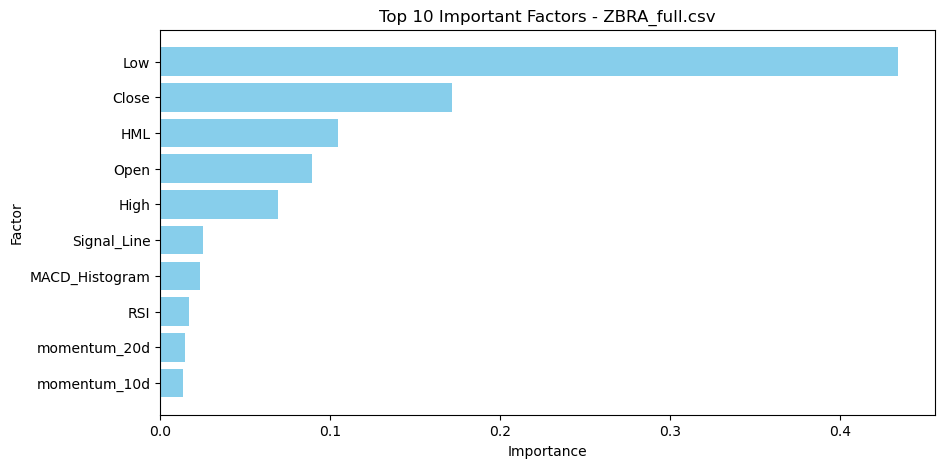

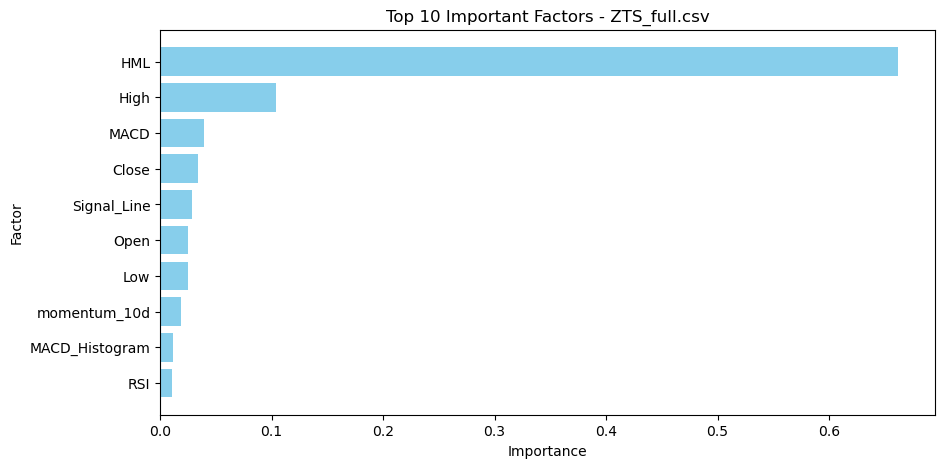

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint

# 读取数据
file_path = "merged_data.csv"  # 确保路径正确
df = pd.read_csv(file_path)

# 按 `FileName` 分组分析
factor_importance_results = {}
num_top_factors = 10  # 选择前 X 个重要因子

for name, group in df.groupby("FileName"):
    group = group.sort_values(by="Date")  # 确保按时间排序
    
    # 计算目标变量：未来90天收益率
    group["future_90d_return"] = (group["Close"].shift(-90) - group["Close"]) / group["Close"]
    group = group.dropna(subset=["future_90d_return"])  # 移除缺失目标值的行
    
    # 选取特征列，排除 `FileName`, `Date`, `future_90d_return`
    feature_cols = [col for col in group.columns if col not in ["FileName", "Date", "future_90d_return"]]
    
    # 处理数据：填充缺失值 & 归一化
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='mean')),
        ('scaler', StandardScaler())
    ])
    
    X = pipeline.fit_transform(group[feature_cols])
    y = group["future_90d_return"].values
    
    # 确保 `feature_cols` 与 `X` 长度一致
    processed_feature_cols = group[feature_cols].columns.tolist()
    
    # 划分训练集和测试集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # 随机搜索优化超参数
    param_dist = {
        "n_estimators": randint(50, 300),
        "max_depth": randint(3, 15),
        "min_samples_split": randint(2, 10),
        "min_samples_leaf": randint(1, 5)
    }
    
    rf = RandomForestRegressor(random_state=42)
    search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=20, cv=3, n_jobs=-1, random_state=42)
    search.fit(X_train, y_train)
    
    # 使用最佳参数训练最终模型
    best_rf = search.best_estimator_
    best_rf.fit(X_train, y_train)
    
    # 计算因子重要性
    processed_feature_cols = feature_cols[:X.shape[1]]  # 取前 24 个特征
    importance = best_rf.feature_importances_
    importance_df = pd.DataFrame({'Factor': processed_feature_cols, 'Importance': importance})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)
    
    # 存储结果
    factor_importance_results[name] = importance_df
    
    # 绘制因子重要性柱状图
    plt.figure(figsize=(10, 5))
    plt.barh(importance_df['Factor'][:num_top_factors], importance_df['Importance'][:num_top_factors], color='skyblue')
    plt.xlabel("Importance")
    plt.ylabel("Factor")
    plt.title(f"Top {num_top_factors} Important Factors - {name}")
    plt.gca().invert_yaxis()
    plt.show()

In [10]:
for name, importance_df in factor_importance_results.items():
    print(f"Top {num_top_factors} Important Factors - {name}")
    print(importance_df.head(num_top_factors))
    print("\n")

Top 10 Important Factors - AAPL_full.csv
            Factor  Importance       FileName
23             HML    0.488674  AAPL_full.csv
3            Close    0.189832  AAPL_full.csv
2              Low    0.060574  AAPL_full.csv
12     Signal_Line    0.060174  AAPL_full.csv
1             High    0.055223  AAPL_full.csv
0             Open    0.045957  AAPL_full.csv
11            MACD    0.020558  AAPL_full.csv
9     momentum_20d    0.019022  AAPL_full.csv
8     momentum_10d    0.015539  AAPL_full.csv
13  MACD_Histogram    0.014939  AAPL_full.csv


Top 10 Important Factors - ABBV_full.csv
            Factor  Importance       FileName
23             HML    0.311345  ABBV_full.csv
3            Close    0.145172  ABBV_full.csv
1             High    0.126158  ABBV_full.csv
13  MACD_Histogram    0.080728  ABBV_full.csv
2              Low    0.073535  ABBV_full.csv
11            MACD    0.061811  ABBV_full.csv
0             Open    0.045132  ABBV_full.csv
12     Signal_Line    0.040823  ABBV_full.

In [11]:
## 保存未来90天收益率预测结果
results_df = pd.DataFrame()
for name, group in df.groupby("FileName"):
    group = group.sort_values(by="Date")
    group["future_90d_return"] = (group["Close"].shift(-90) - group["Close"]) / group["Close"]
    group = group.dropna(subset=["future_90d_return"])
    results_df = pd.concat([results_df, group[["FileName", "Date", "future_90d_return"]]])
results_df.to_csv("future_90d_return.csv", index=False)


            Factor  Importance
3              HML    0.327418
1            Close    0.150556
4             High    0.133035
5              Low    0.094372
9             Open    0.068635
12     Signal_Line    0.061892
6             MACD    0.058844
11             SMB    0.042330
18    momentum_20d    0.021617
7   MACD_Histogram    0.019943


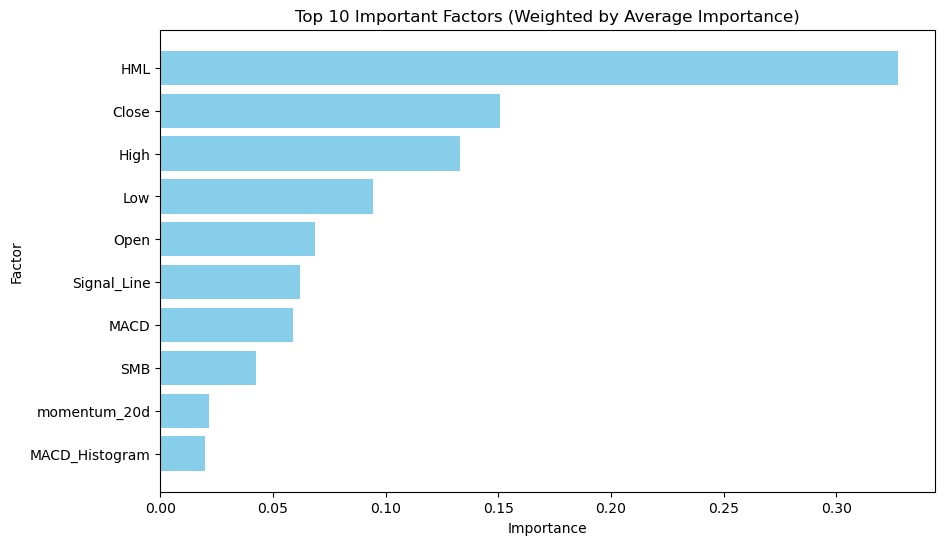

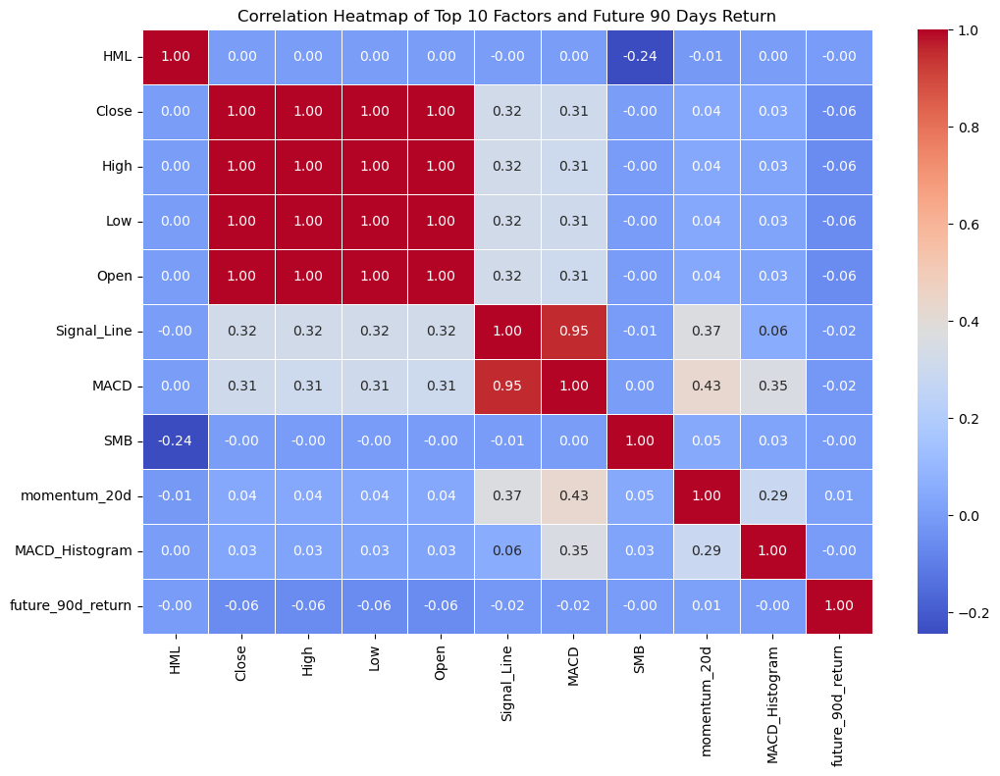

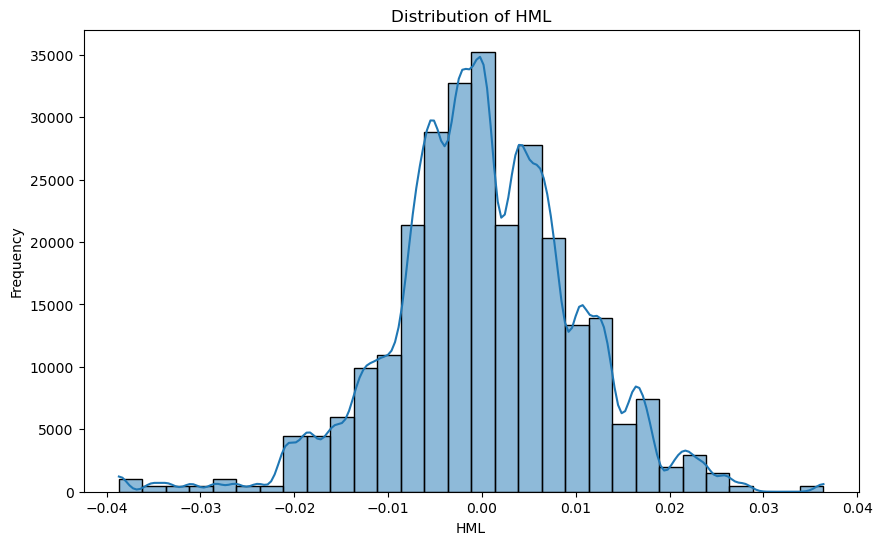

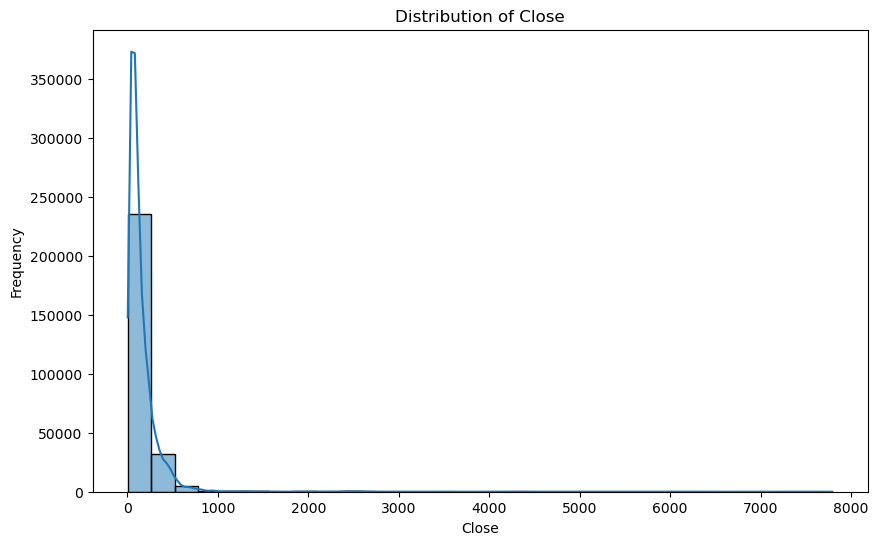

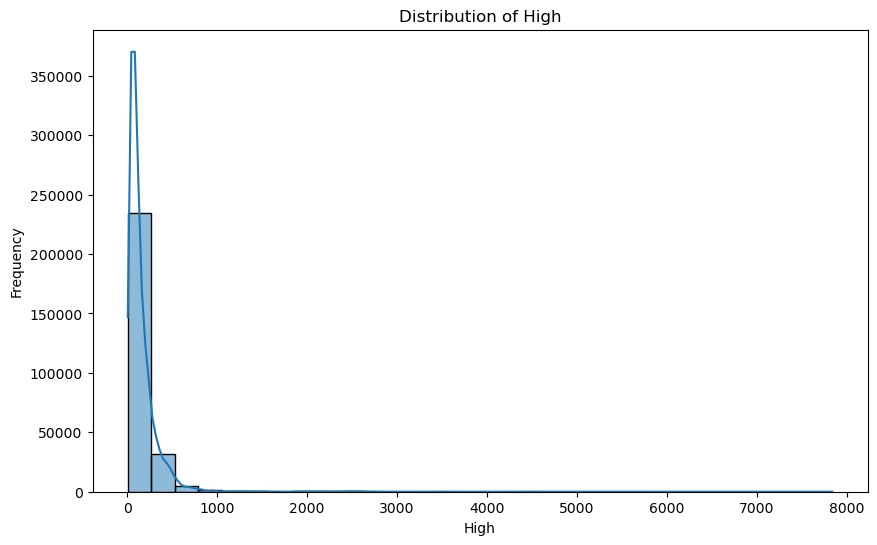

...

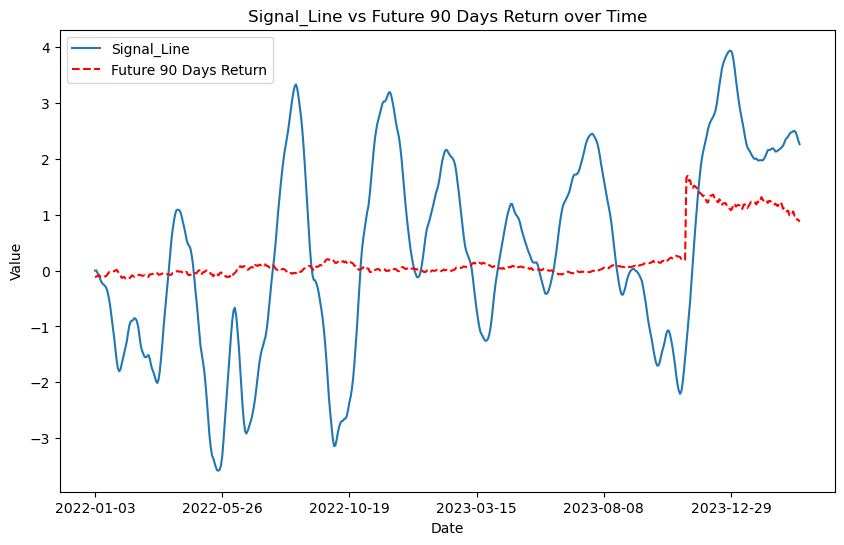

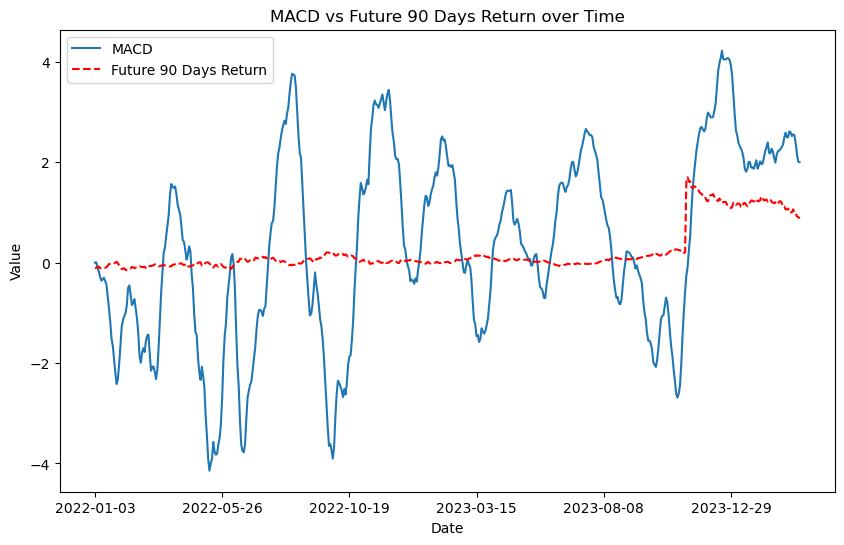

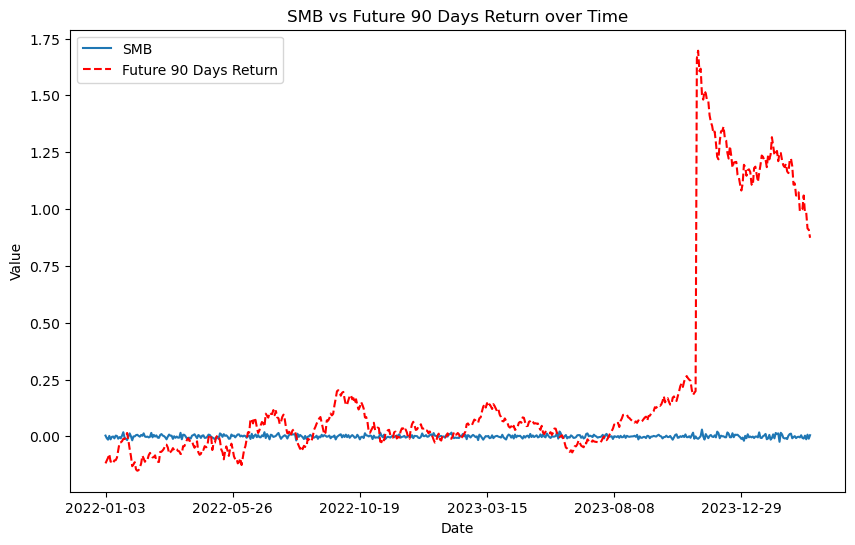

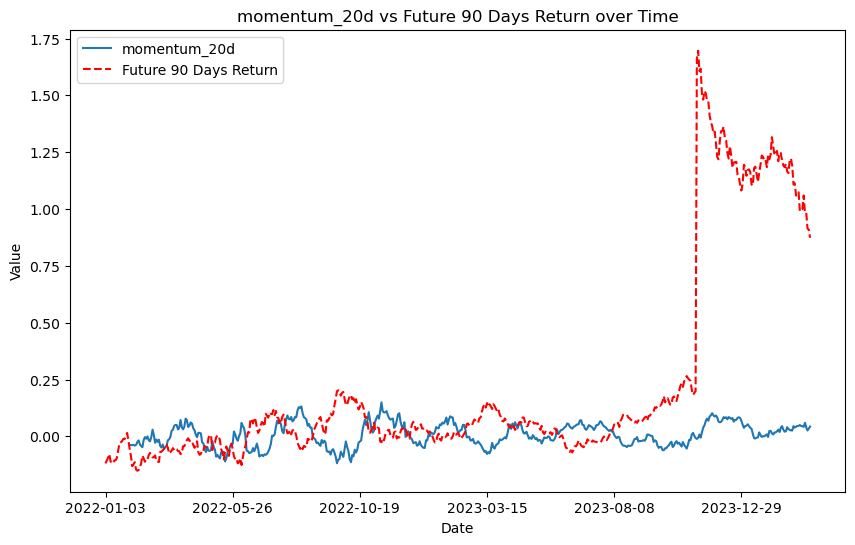

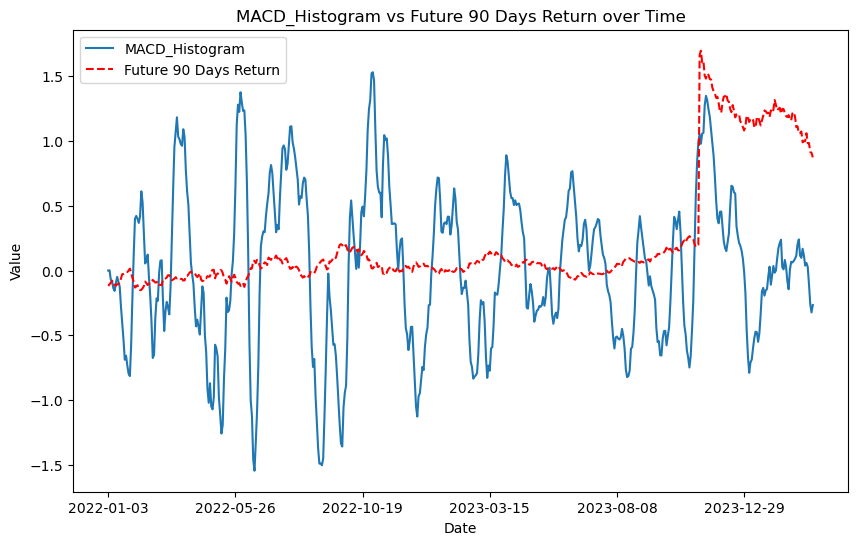

In [ ]:
# 1. 对每支股票进行加权，得到最终对所有股票未来收益率最重要的前10个因子
# 将所有因子的权重（重要性）加权并进行排序，选取前10个最重要的因子

# 创建一个空的 DataFrame 用于存储所有股票的因子重要性
all_factors_importance = pd.DataFrame()

# 汇总所有股票的因子重要性数据
for name, importance_df in factor_importance_results.items():
    importance_df['FileName'] = name  # 添加股票名称
    all_factors_importance = pd.concat([all_factors_importance, importance_df])

# 计算每个因子的平均重要性
avg_importance = all_factors_importance.groupby('Factor')['Importance'].mean().reset_index()
avg_importance = avg_importance.sort_values(by='Importance', ascending=False)

# 选择前10个最重要的因子
top_10_factors = avg_importance.head(10)
print(top_10_factors)

# 2. 绘制前10个因子的柱状图
plt.figure(figsize=(10, 6))
plt.barh(top_10_factors['Factor'], top_10_factors['Importance'], color='skyblue')
plt.xlabel("Importance")
plt.ylabel("Factor")
plt.title("Top 10 Important Factors (Weighted by Average Importance)")
plt.gca().invert_yaxis()  # 反转 Y 轴，使最重要的因子在顶部
plt.show()

# 3. 计算相关性矩阵
factor_columns = top_10_factors['Factor'].tolist()

correlation_matrix = df[factor_columns + ['future_90d_return']].corr()

# 4. 绘制相关性热力图
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Top 10 Factors and Future 90 Days Return')
plt.show()

# 5. 可视化每个因子的分布
for factor in top_10_factors['Factor']:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[factor], kde=True, bins=30)
    plt.title(f'Distribution of {factor}')
    plt.xlabel(factor)
    plt.ylabel('Frequency')
    plt.show()


# 将每个因子的变化趋势与未来收益率做对比
for factor in top_10_factors['Factor']:
    plt.figure(figsize=(10, 6))
    df.groupby('Date')[factor].mean().plot(label=factor)
    df.groupby('Date')['future_90d_return'].mean().plot(label='Future 90 Days Return', linestyle='--', color='red')
    plt.title(f'{factor} vs Future 90 Days Return over Time')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()
